# Evaluating GAN
# keywords: inception score

Today we will look at DCGANs trained on CIFAR10 and evaluate their performance.
At first let's download CIFAR10 dataset.

In [ ]:
import os
import torch
import torchvision
import torch.nn as nn
from torchvision import transforms
from torchvision.utils import save_image
from torch.autograd import Variable
import matplotlib.pyplot as plt
import pylab
import numpy as np
%load_ext autoreload
%autoreload 2

In [ ]:
class IgnoreLabelDataset(torch.utils.data.Dataset):
  def __init__(self, orig):
    self.orig = orig

  def __getitem__(self, index):
    return self.orig[index][0]

  def __len__(self):
    return len(self.orig)

import torchvision.datasets as dset
import torchvision.transforms as transforms

cifar = dset.CIFAR10(root='data/', download=True,
                    transform=transforms.Compose([
                        transforms.Scale(32),
                        transforms.ToTensor(),
                        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                    ])
)

no_labels_cifar = IgnoreLabelDataset(cifar)

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:285: UserWarning: The use of the transforms.Scale transform is deprecated, please use transforms.Resize instead.
  warnings.warn("The use of the transforms.Scale transform is deprecated, " +


Files already downloaded and verified


In [ ]:
def show_image(image):

  # Invert normalization to get back: 255* ( image * variance + mean )
  img = 255*(image.numpy().transpose((1,2,0)) * (0.5, 0.5, 0.5) + (0.5, 0.5, 0.5))
  plt.imshow(img.astype(np.int32), interpolation='bilinear')

Before you'll judge the gan output, let's have a look on cifar10 itself...

In [ ]:
# R, C = 5, 5

# plt.figure(figsize=(15, 15))
# for i in range(25):
#     plt.subplot(R, C, i + 1)
#     show_image(no_labels_cifar[i])
# plt.show()

Let's download DCGAN for CIFAR10 with pretrained weihgts.

In [ ]:
!git clone https://github.com/csinva/gan-vae-pretrained-pytorch.git

fatal: destination path 'gan-vae-pretrained-pytorch' already exists and is not an empty directory.


In [ ]:
import sys 
sys.path.insert(0, '/content/gan-vae-pretrained-pytorch/cifar10_dcgan')

In [ ]:
num_gpu = 1 
import dcgan

from dcgan import Generator

dcgan_generator = Generator(ngpu=1).eval()
   
dcgan_generator.load_state_dict(torch.load('/content/gan-vae-pretrained-pytorch/cifar10_dcgan/weights/netG_epoch_199.pth'))
dcgan_generator = dcgan_generator.cuda()

In [ ]:
dcgan_generator

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (13): Tanh()
  )
)

Here are samples of images generated by DCGAN:

In [ ]:

batch_size = 25
latent_size = 100

# noise sampled from each value seperately from normal dist
# this gan was trained with this kind of noise
fixed_noise = torch.randn(batch_size, latent_size, 1, 1)
if torch.cuda.is_available():
    fixed_noise = fixed_noise.cuda()
fake_images = dcgan_generator(fixed_noise)

# R, C = 5, 5
# plt.figure(figsize=(15, 15))
# for i in range(batch_size):
#     plt.subplot(R, C, i + 1)
#     show_image(fake_images[i].detach().cpu())
# plt.show()

Let's download another GAN (SNGAN).

In [ ]:
!git clone https://github.com/GongXinyuu/sngan.pytorch.git

fatal: destination path 'sngan.pytorch' already exists and is not an empty directory.


Download cifar statistics:

In [ ]:
! curl http://bioinf.jku.at/research/ttur/ttur_stats/fid_stats_cifar10_train.npz -o sngan.pytorch/fid_stat/fid_stats_cifar10_train.npz

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0Warning: Failed to create the file 
  0 30.6M    0 13414    0     0  34306      0  0:15:37 --:--:--  0:15:37 34306
curl: (23) Failed writing body (0 != 13414)


Download weights from google drive:

In [ ]:
! mkdir sngan.pytorch/pre_trained

mkdir: cannot create directory ‘sngan.pytorch/pre_trained’: File exists


In [ ]:
!pip install -U -q PyDrive

In [ ]:
from google.colab import auth
auth.authenticate_user()

In [ ]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from oauth2client.client import GoogleCredentials

gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

fileId = '1koEJbx9anP2-BEMrqX6jgWXAvEUXG0AU'
fileName = fileId
downloaded = drive.CreateFile({'id': fileId})
downloaded.GetContentFile(fileName)

In [ ]:
!mv /content/1koEJbx9anP2-BEMrqX6jgWXAvEUXG0AU sngan.pytorch/pre_trained/sngan_cifar10.pth

In [ ]:
import sys  
sys.path.insert(0, '/content/sngan.pytorch')

In [ ]:
import models

In [ ]:
# parameters for our GAN same as checkpoint downloaded from google

class args:

  # pixels
  img_size = 32

  # noise size
  latent_dim = 128
  gf_dim = 256
  bottom_width = 4
  g_spectral_norm = False

In [ ]:
sngan_generator = models.sngan_cifar10.Generator(args=args).cuda()


In [ ]:
sngan_generator

Generator(
  (activation): ReLU()
  (l1): Linear(in_features=128, out_features=4096, bias=True)
  (block2): GenBlock(
    (activation): ReLU()
    (c1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (c2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (b1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (b2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (c_sc): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
  )
  (block3): GenBlock(
    (activation): ReLU()
    (c1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (c2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (b1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (b2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (c_sc): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
  

In [ ]:
from torch.utils.tensorboard import SummaryWriter

In [ ]:
  writer = SummaryWriter(log_dir="logs")
  writer.add_graph(sngan_generator, torch.randn(25, 128).cuda())
  writer.close()

In [ ]:
# %load_ext tensorboard

In [ ]:
# %tensorboard --logdir logs

In [ ]:
checkpoint_file = "/content/sngan.pytorch/pre_trained/sngan_cifar10.pth"


In [ ]:
checkpoint = torch.load(checkpoint_file)

In [ ]:
sngan_generator.load_state_dict(checkpoint)

<All keys matched successfully>

In [ ]:
sngan_generator = sngan_generator.cuda().eval()

Let's draw some examples:

In [ ]:
batch_size = 25
latent_size = 128

fixed_noise = torch.randn(batch_size, latent_size)
if torch.cuda.is_available():
    fixed_noise = fixed_noise.cuda()
fake_images = sngan_generator(fixed_noise)

# R, C = 5, 5
# plt.figure(figsize=(15, 15))
# for i in range(batch_size):

#     plt.subplot(R, C, i + 1)
#     show_image(fake_images[i].detach().cpu())
# plt.show()

How can we compare this generators?
Inception score (see, ex. https://medium.com/octavian-ai/a-simple-explanation-of-the-inception-score-372dff6a8c7a)



In [ ]:
import torch
from torch import nn
from torch.autograd import Variable
from torch.nn import functional as F
import torch.utils.data

from torchvision.models.inception import inception_v3

import numpy as np
from scipy.stats import entropy

In [ ]:
dtype = torch.cuda.FloatTensor
inception_model = inception_v3(pretrained=True, transform_input=False).type(dtype)
inception_model.eval()

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [ ]:
def inception_score(imgs, batch_size=32, resize=False, splits=1):
    """Computes the inception score of the generated images imgs
    imgs -- Torch dataset of (3xHxW) numpy images normalized in the range [-1, 1]
    cuda -- whether or not to run on GPU
    batch_size -- batch size for feeding into Inception v3
    splits -- number of splits
    """
    N = len(imgs)
    print(f"number of images is {N}")
    assert batch_size > 0
    assert N > batch_size


    # Set up dataloader
    dataloader = torch.utils.data.DataLoader(imgs, batch_size=batch_size)


    up = nn.Upsample(size=(299, 299), mode='bilinear').type(dtype)
    def get_pred(x):
        if resize:
            x = up(x)
        x = inception_model(x)
        return F.softmax(x).data.cpu().numpy()

    # Get predictions
    print ("allocating memory for predictions")
    preds = np.zeros((N, 1000))
    print("running predictions")
    for i, batch in enumerate(dataloader, 0):
        batch = batch.type(dtype)
        batchv = Variable(batch)
        batch_size_i = batch.size()[0]

        preds[i*batch_size:i*batch_size + batch_size_i] = get_pred(batchv)

    # Now compute the mean kl-div per split
    # Stabilizing the value by splitting the dataset in 10 parts
    # Avoid high variance of inception score by averaging
    split_scores = []

    for k in range(splits):
        print(f"split {k}")
        part = preds[k * (N // splits): (k+1) * (N // splits), :]
        py = np.mean(part, axis=0)
        scores = []
        for i in range(part.shape[0]):
            pyx = part[i, :]
            scores.append(entropy(pyx, py))
        split_scores.append(np.exp(np.mean(scores)))

    return np.mean(split_scores), np.std(split_scores)


In [ ]:
torch.cuda.empty_cache()

In [ ]:
# print ("calculating inception_score")

# # in CIFAR will be condensed because there are only 10 classes
# # Each of the images will have activation in these 10 classes
# # Unavoidable result becauses of only 10 classes in CIFAR dataset

# print (inception_score(no_labels_cifar, batch_size=64, resize=True, splits=10))

# ## RESULT
# (9.672773970628956, 0.1499143477811533)
# INC_Score: 9
# Variance: 0.15

- (9.672773970628956, 0.1499143477811533)
- INC_Score: 9 
- Variance: 0.15

One of the weak spots of inception score is that it evaluates only "realism" of the images, without comparing them to the dataset GAN was trained on. It may be a good think (if original dataset is biased toward some statistics and generative network fixed the bias), but sometimes it's needed tho match original distribution. In this case FID (Fréchet Inception Distance) https://github.com/mseitzer/pytorch-fid can be used.

Inception score does not take into account how much your images look like the CIFAR10 dataset.


Fréchet Inception Distance

Use Inception network, but instead of comparing inception score, look at activations of
some intermediate layer of the network, and you want the distribution of activations to be 
the same for the gernerator dataset and the basic dataset
Some layer pretty close to the last layer inception network trained on imagenet
compute activation on generated dataset
you want same distributions on these two


A good overview of GAN evaluation metrics: https://arxiv.org/pdf/1802.03446.pdf.


IS does not detect small support set or "mode collapse". 

In [ ]:
def get_k_nearest(images, k, distance_fn):
  distances = []
  for n1, i1 in enumerate(images):
    for n2, i2 in enumerate(images):
      if n1 == n2:
        continue
      distances.append({"i1": i1, "i2": i2, "distance": distance_fn(i1, i2)})
  return sorted(distances, key=lambda x: x["ditance"])[:k]

In [ ]:
import  math
math.sqrt(500) * 2

44.721359549995796

If we want to "guarantee" that GAN can generate at least 1000000 images, how many images shall we generate for k_nearest test?

## Answer:

1000 (birthday paradox)

What are good distances functions?
$L_2$, "perception distance" ($L_2$ computed on intermidiate layer of deep classification network).

Another problem: GAN can memorize the dataset.


In [ ]:
def get_k_nearest_from_dataset(image, dataset, k, distance_fn):
  distances = []
  for n, i in enumerate(dataset):
      distances.append({"i": n, "distance": distance_fn(i1, i2)})
  return sorted(distances, key=lambda x: x["distance"])[:k]

How many images should we test to know that probability of outputing dataset image is less than 10%?

An interesting study of 2017-year SOTA gans by Sajeev Arora: https://arxiv.org/pdf/1706.08224.pdf

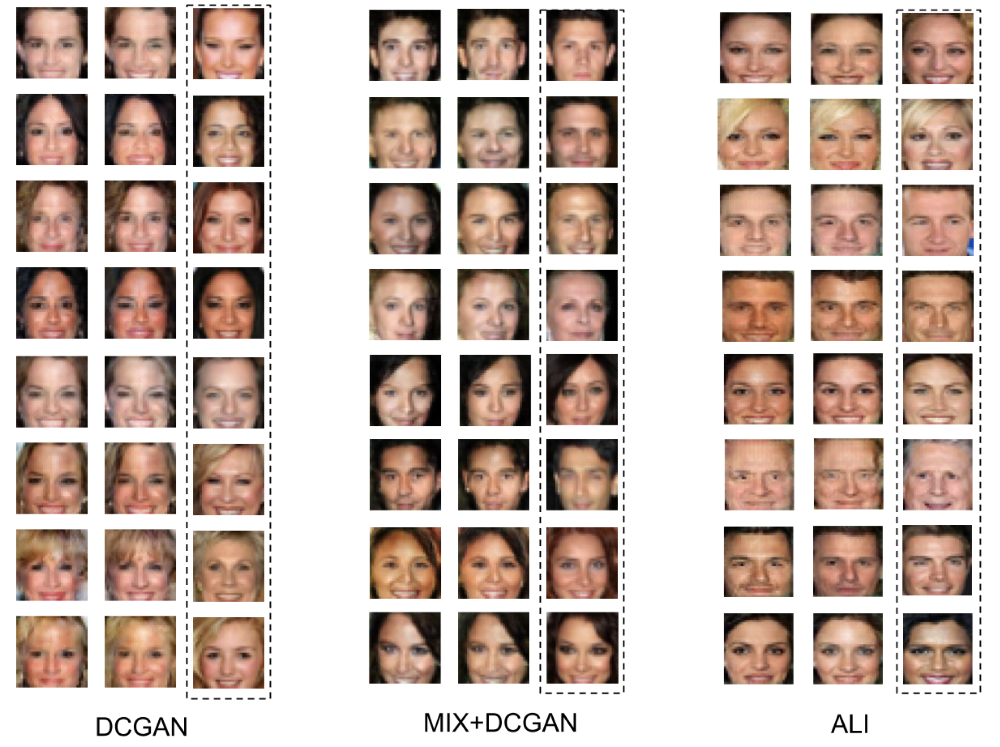

# Assignment
1. Compute Inception Score for the two GANs from the class (generate dataset of 50000) images.[3]
2. Check for mode collapse. There are 60000 different images in CIFAR, so it'll be great if GAN can output at least 90000 different images. Generate a dataset of 300 GANed images. Find 10 pairs with the closest $L_2$ distance. Output this pairs. Are they different enough? [4]
3. Check for dataset memorization. Generate 5 images from each GAN. For each image find and output top 10 images in cifar with the closest $L_2$ distance. Are they different enough from the original images? [3]

## General

In [ ]:
import os
import torch
import torchvision
import torch.nn as nn
from torchvision import transforms
from torchvision.utils import save_image
from torch.autograd import Variable
import matplotlib.pyplot as plt
import pylab
import numpy as np
%load_ext autoreload
%autoreload 2


import torchvision.datasets as dset
import torchvision.transforms as transforms

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
import sys  
import dcgan
from dcgan import Generator

In [ ]:
import torch
from torch import nn
from torch.autograd import Variable
from torch.nn import functional as F
import torch.utils.data
from torchvision.models.inception import inception_v3
import numpy as np
from scipy.stats import entropy
import math
import numpy

# 1. Compute Inception Score for the two GANs from the class (generate dataset of 50000) images.[3]

- Look at result from inception score
- GAN was not evaluated
- This example was tested on 50k images
- Now you need to generate 50.000 images with both GAN models (dcGAN, snGAN)
- Then compute inception score for the generator images
- Compare to CIFAR10, and to each other
- Understand the range comparing with CIFAR10 score
- What is the best value?
- Baseline value provided

```
calculating inception_score
number of images is 50000
allocating memory for predictions
running predictions
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3458: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
split 0
split 1
split 2
split 3
split 4
split 5
split 6
split 7
split 8
split 9
(9.672773970628956, 0.1499143477811533)
```

## CIFAR10 REFERENCE Result

- (9.672773970628956, 0.1499143477811533)
- INC_Score: 9
- Variance: 0.15

## DCGAN

In [ ]:
torch.cuda.empty_cache()

In [ ]:
def per_batch_dcgan(batch_size, latent_size):
  
  with torch.no_grad():

    fixed_noise = torch.randn(batch_size, latent_size_dcgan, 1, 1)

    if torch.cuda.is_available():
        fixed_noise = fixed_noise.cuda()
    fake_images = dcgan_generator(fixed_noise)

    del fixed_noise

  return fake_images.cpu()

In [ ]:
# ## Constants
# fake_data_set_size = 50000
# batch_size = 500
# latent_size_dcgan = 100

# ## Computed constants
# runs_required = int(fake_data_set_size / batch_size)
# print('runs_required: ', runs_required)
# fixed_noise = torch.randn(batch_size, latent_size_dcgan, 1, 1)

# ## Init(9.672773970628956, 0.1499143477811533)
# generated_dataset_dcgan = torch.tensor([])
# for runs in range(runs_required):
#   if runs % 10 == 0:
#     print('run: ', runs)
#   fake_images_batch_dcgan = per_batch_dcgan(batch_size, latent_size)
#   generated_dataset_dcgan = torch.cat((generated_dataset_dcgan, fake_images_batch_dcgan), 0)

In [ ]:
# print (inception_score(generated_dataset_dcgan, batch_size=64, resize=True, splits=10))

## Result inception score dcgan:

(4.796514275685559, 0.051628262458892044)

## SNGAN

In [ ]:
def per_batch_sngan(batch_size, latent_size):
  
  with torch.no_grad():
    
    fixed_noise_sngan = torch.randn(batch_size, latent_size)

    if torch.cuda.is_available():
        fixed_noise = fixed_noise_sngan.cuda()
    fake_images = sngan_generator(fixed_noise)

    del fixed_noise

  return fake_images.cpu()

In [ ]:
# ## Constants
# fake_data_set_size = 50000
# batch_size = 500
# latent_size_sngan = 128

# ## Computed constants
# runs_required = int(fake_data_set_size / batch_size)
# print('runs_required: ', runs_required)


# ## Init
# generated_dataset_sngan = torch.tensor([])
# for runs in range(runs_required):
#   if runs % 10 == 0:
#     print('run: ', runs)
#   fake_images_batch_sngan = per_batch_sngan(batch_size, latent_size_sngan)
#   generated_dataset_sngan = torch.cat((generated_dataset_sngan, fake_images_batch_sngan), 0)

In [ ]:
# print(inception_score(generated_dataset_sngan, batch_size=64, resize=True, splits=10))

## Result inception score sngan:

(6.692252000916774, 0.05539586580418136)


## Summary results
- Inception score, variance
- CIFAR10: (9.672773970628956, 0.1499143477811533)
- DC_GAN: (4.796514275685559, 0.051628262458892044)
- SN_GAN: (6.692252000916774, 0.05539586580418136)

## Conclusion on inception scores

SN_GAN performs better than DC_GAN because the inception score is closer to that of the CIFAR10 dataset.

# 2. Check for mode collapse. There are 60000 different images in CIFAR, so it'll be great if GAN can output at least 90000 different images. Generate a dataset of 300 GANed images. Find 10 pairs with the closest  L2  distance. Output this pairs. Are they different enough? [4]

Collapsing Mode:
- Generated dataset has small support

What does this mean? 
- Even if you generate different images of different classes, each class on its own has many different modes
- For example class cats: there must be a lot of different looking cats
- But your generative model only generates siamese cats
- Diverse images, but not a realistic range of real world images

Small support 
- model is generating different images from different classes
- Different instances of the class, but still the number of images is pretty small
- Example: 50k images in CIFAR, train model which only makes 5000 images -> small support
- Still has high inception score
- Still has nice FI distance over these 5000 images
- But the GAN is not usefull
- Need to check for small support set
- How?
- Compute distance between images
- Iterate over images twice
- Compute distance between all pairs
- Return k most closest pairs in the dataset
- Big problem!
- Generate 50k images, then its infeasible to run such a test because its quadratic in side of the dataset, high complexity
- If we assume that our GAN generates 100 different images, how much images should we generate to have a high probability to generate a pair of similar images? Answer is 10
- Birthday Paradox-
- Why? When there are 30 person in class there is a high probability 2 person will share the same date. Why? You are looking at pairs. The number of pairs is 30 * 29 / 2 = 435 pairs. The probability that a pair has the same birthday date is 1 / 365 days. The number of experiments with class of 30 persons is 435, therefore the probability we have at least 1 succes is close to 1.
- Same stuff accounts for the images set.
- Basically we need approximately square root of support size (sqrt(100) = 10) * 2
- sqrt(N) * 2
- Then we have with high probability a pair of similar images during testing

In practice:
- If you want your GAN to be good
- Assume support set should be at least as large as CIFAR10 (50.000 >)
- sqrt(50000) * 2
- Output 20 pars who are most similar
- Look at them if they are indeed the same image or not
- Best for human to visually check

## General Functions for this Assignment

In [ ]:
def distance_fn(i1, i2):
    return torch.sum((i1-i2)**2)

In [ ]:
def get_k_nearest(images, k, distance_fn):
  distances = []
  for n1, i1 in enumerate(images):
    for n2, i2 in enumerate(images):
      if n1 == n2:
        continue
      distances.append({"i1": i1, "i2": i2, "distance": distance_fn(i1, i2)})
  return sorted(distances, key=lambda x: x["distance"])[:k]

## DCGAN - Check Mode Collapse

In [ ]:
## Constants
fake_data_set_size = 300
batch_size = 300
latent_size_dcgan = 100

## Computed constants
runs_required = int(fake_data_set_size / batch_size)
print('runs_required: ', runs_required)
fixed_noise = torch.randn(batch_size, latent_size_dcgan, 1, 1)

## Init(9.672773970628956, 0.1499143477811533)
generated_dataset_dcgan = torch.tensor([])
for runs in range(runs_required):
  if runs % 10 == 0:
    print('run: ', runs)
  fake_images_batch_dcgan = per_batch_dcgan(batch_size, latent_size)
  generated_dataset_dcgan = torch.cat((generated_dataset_dcgan, fake_images_batch_dcgan), 0)
generated_dataset_dcgan.shape

runs_required:  1
run:  0


torch.Size([300, 3, 32, 32])

In [ ]:
k = 10
k_nearest_neighbours_L2_dcgan = get_k_nearest(generated_dataset_dcgan, k, distance_fn)

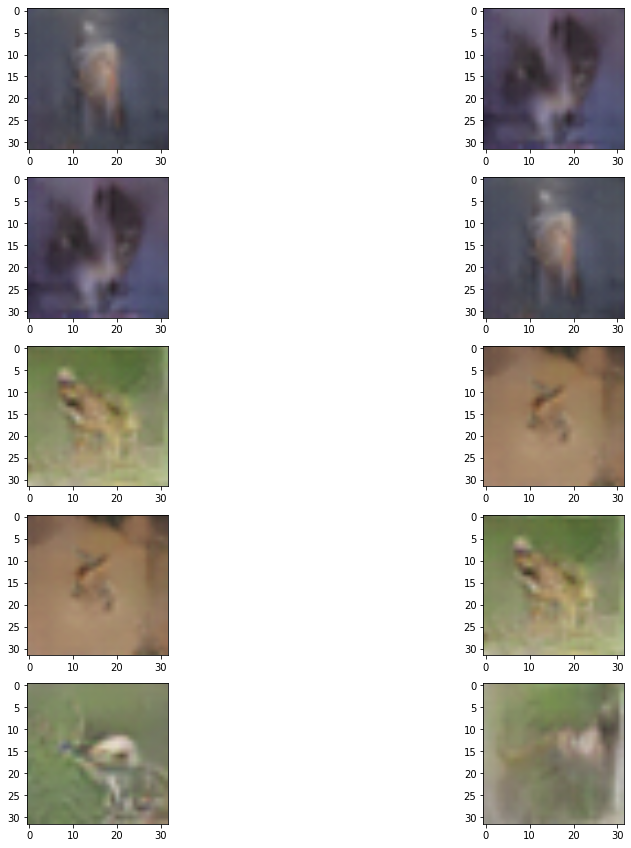

In [ ]:
R, C = k, 2
plt.figure(figsize=(15, 15))
for i in range(k):
  plt.subplot(R, C, i*2 + 1)
  show_image(k_nearest_neighbours_L2_dcgan[i]['i1'])
  plt.subplot(R, C, i*2 + 2)
  show_image(k_nearest_neighbours_L2_dcgan[i]['i2'])
plt.show()

## SNGAN - Check Mode Collapse

In [ ]:
## Constants
fake_data_set_size = 300
batch_size = 300
latent_size_sngan = 128

## Computed constants
runs_required = int(fake_data_set_size / batch_size)
print('runs_required: ', runs_required)
fixed_noise_sngan = torch.randn(batch_size, latent_size)


## Init
generated_dataset_sngan = torch.tensor([])
for runs in range(runs_required):
  if runs % 10 == 0:
    print('run: ', runs)
  fake_images_batch_sngan = per_batch_dcgan(batch_size, latent_size_sngan)
  generated_dataset_sngan = torch.cat((generated_dataset_sngan, fake_images_batch_sngan), 0)
generated_dataset_sngan.shape

runs_required:  1
run:  0


torch.Size([300, 3, 32, 32])

In [ ]:
k = 10
k_nearest_neighbours_L2_sngan = get_k_nearest(generated_dataset_sngan, k, distance_fn)

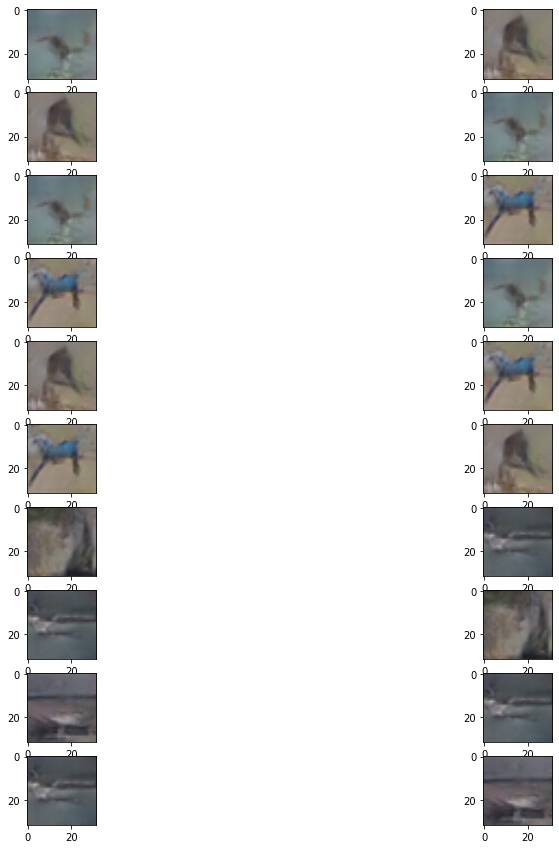

In [ ]:
R, C = k, 2
plt.figure(figsize=(15, 15))
for i in range(k):
  plt.subplot(R, C, i*2 + 1)
  show_image(k_nearest_neighbours_L2_sngan[i]['i1'])
  plt.subplot(R, C, i*2 + 2)
  show_image(k_nearest_neighbours_L2_sngan[i]['i2'])
plt.show()

## Conclusion: are they different enough?


- According to the practice session, it is best for a human to visually check if there is a case of mode collapse.

- For me it seems like not a case of mode collapse for both models, as they both generate the different images

- Note: there is every time a pair of images because I dont filter for duplicates

# 3. Check for dataset memorization. Generate 5 images from each GAN. For each image find and output top 10 images in cifar with the closest  L2  distance. Are they different enough from the original images? [3]

Problems with GAN:
- GAN indeed generates novel images
- Look at Generated Images and compare them to the images in the dataset
- How do you compare them? 
- Method 1: compare the pixel distance L1 or L2 distance (prefer L1, L2 sensitive to pixel noise)
- Method 2: Perception distance; VGG network used during the lecture
- Just shows perfect scores because just loads images from the existing dataset

## General

In [ ]:
def distance_fn(i1, i2):
    return torch.sum((i1-i2)**2)

In [172]:
def get_k_nearest_from_dataset(image, dataset, k, distance_fn):
  distances = []
  for n, i in enumerate(dataset):
      distances.append({"i": i, "distance": distance_fn(i, image)})
  distances = sorted(distances, key=lambda x: x["distance"])[:k]
  result = []
  for i in range(len(distances)):
    result.append(distances[i]['i'])
  return result

In [173]:
len(no_labels_cifar)

50000

## DCGAN - Compare with closest CIFAR10 images

---



In [174]:
## Constants
fake_data_set_size = 5
batch_size = 5
latent_size_dcgan = 100

## Computed constants
runs_required = int(fake_data_set_size / batch_size)
print('runs_required: ', runs_required)
fixed_noise = torch.randn(batch_size, latent_size_dcgan, 1, 1)

## Init(9.672773970628956, 0.1499143477811533)
generated_dataset_dcgan = torch.tensor([])
for runs in range(runs_required):
  if runs % 10 == 0:
    print('run: ', runs)
  fake_images_batch_dcgan = per_batch_dcgan(batch_size, latent_size)
  generated_dataset_dcgan = torch.cat((generated_dataset_dcgan, fake_images_batch_dcgan), 0)
generated_dataset_dcgan.shape

runs_required:  1
run:  0


torch.Size([5, 3, 32, 32])

In [175]:
generated_dataset_dcgan[0]

tensor([[[-0.6754, -0.5621, -0.4400,  ..., -0.7494, -0.7551, -0.7748],
         [-0.5946, -0.5048, -0.4117,  ..., -0.6773, -0.6561, -0.6983],
         [-0.5413, -0.4812, -0.4539,  ..., -0.6689, -0.6743, -0.6408],
         ...,
         [-0.3815, -0.1856, -0.0409,  ..., -0.5324, -0.5239, -0.5054],
         [-0.3866, -0.2656,  0.0421,  ..., -0.5643, -0.5387, -0.5145],
         [ 0.0424,  0.2641,  0.3021,  ..., -0.5397, -0.5162, -0.5115]],

        [[-0.6947, -0.5843, -0.4826,  ..., -0.7374, -0.7487, -0.8216],
         [-0.5891, -0.5280, -0.4953,  ..., -0.7259, -0.6950, -0.7725],
         [-0.5587, -0.5302, -0.5256,  ..., -0.7175, -0.6992, -0.7694],
         ...,
         [-0.2544, -0.1275,  0.0392,  ..., -0.5901, -0.4430, -0.4731],
         [-0.3689, -0.1526,  0.0672,  ..., -0.5172, -0.4230, -0.3891],
         [-0.0090,  0.1195,  0.2111,  ..., -0.5657, -0.4401, -0.4689]],

        [[-0.4358, -0.2605, -0.2432,  ..., -0.7058, -0.7070, -0.7206],
         [-0.2685, -0.2633, -0.2322,  ..., -0

In [176]:
number_of_images = 5
number_of_lookalikes = 10
nearest_images_list_dcgan_CIFAR10 = []
for i in range(number_of_images):
  k_nearest_neighbours_L2_dcgan_CIFAR10_per_image = get_k_nearest_from_dataset(generated_dataset_dcgan[i], no_labels_cifar, number_of_lookalikes, distance_fn)
  nearest_images_list_dcgan_CIFAR10.append(k_nearest_neighbours_L2_dcgan_CIFAR10_per_image)

In [178]:
len(nearest_images_list_dcgan_CIFAR10[0])

10

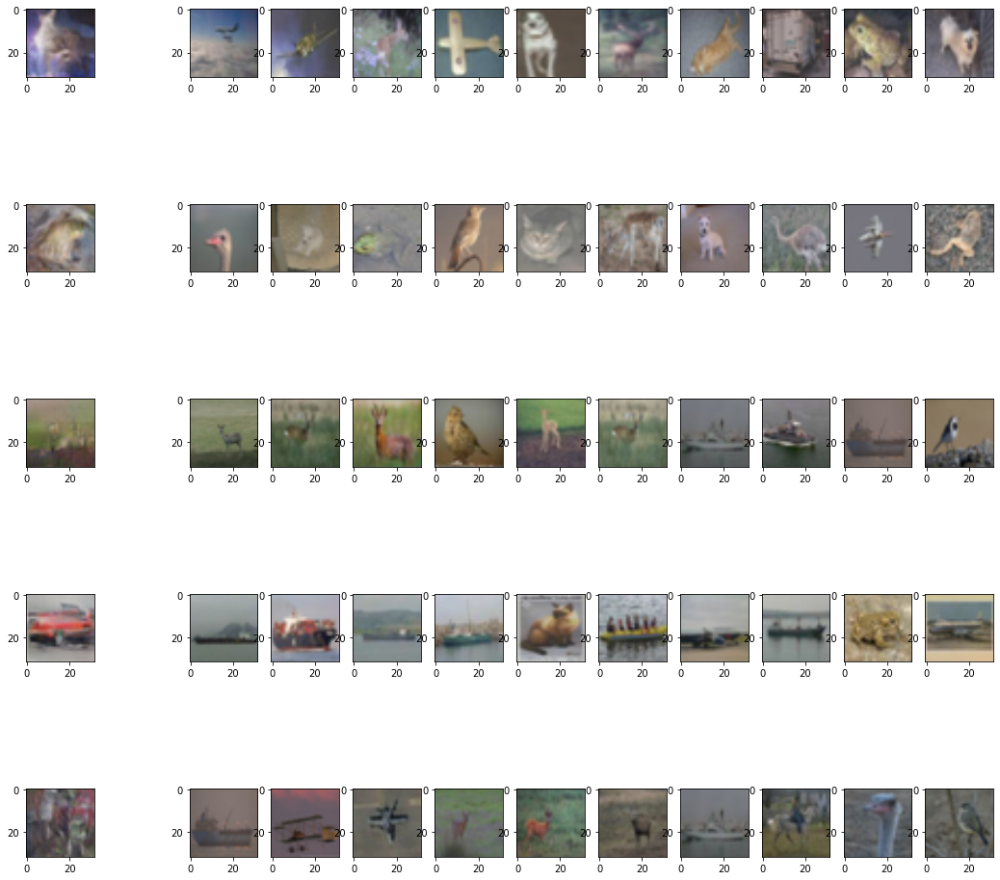

In [179]:
R, C = 5, 12
plt.figure(figsize=(18, 18))
for i in range(5):
    plt.subplot(R, C, i*12 + 1)
    show_image(generated_dataset_dcgan[i])
    for j in range(2, 12):
      plt.subplot(R, C, i*12 + j + 1)
      show_image(nearest_images_list_dcgan_CIFAR10[i][j - 2])
plt.show()

In [ ]:
for i in range(5):
  print('PICTURE NUMBER', i)
  print(nearest_images_list_dcgan_CIFAR10[0]) 
  print('\n')

PICTURE NUMBER 0
[{'i': 42014, 'distance': tensor(240.4297)}, {'i': 24823, 'distance': tensor(252.8762)}, {'i': 2133, 'distance': tensor(261.5629)}, {'i': 42516, 'distance': tensor(272.8065)}, {'i': 49138, 'distance': tensor(274.1655)}, {'i': 24778, 'distance': tensor(274.3472)}, {'i': 42434, 'distance': tensor(274.3981)}, {'i': 35714, 'distance': tensor(274.4594)}, {'i': 42721, 'distance': tensor(276.0537)}, {'i': 46115, 'distance': tensor(277.2147)}]


PICTURE NUMBER 1
[{'i': 42014, 'distance': tensor(240.4297)}, {'i': 24823, 'distance': tensor(252.8762)}, {'i': 2133, 'distance': tensor(261.5629)}, {'i': 42516, 'distance': tensor(272.8065)}, {'i': 49138, 'distance': tensor(274.1655)}, {'i': 24778, 'distance': tensor(274.3472)}, {'i': 42434, 'distance': tensor(274.3981)}, {'i': 35714, 'distance': tensor(274.4594)}, {'i': 42721, 'distance': tensor(276.0537)}, {'i': 46115, 'distance': tensor(277.2147)}]


PICTURE NUMBER 2
[{'i': 42014, 'distance': tensor(240.4297)}, {'i': 24823, 'distan

## SNGAN - Compare with closest CIFAR10 images

In [180]:
## Constants
fake_data_set_size = 5
batch_size = 5
latent_size_sngan = 128

## Computed constants
runs_required = int(fake_data_set_size / batch_size)
print('runs_required: ', runs_required)
fixed_noise_sngan = torch.randn(batch_size, latent_size)


## Init
generated_dataset_sngan = torch.tensor([])
for runs in range(runs_required):
  if runs % 10 == 0:
    print('run: ', runs)
  fake_images_batch_sngan = per_batch_dcgan(batch_size, latent_size_sngan)
  generated_dataset_sngan = torch.cat((generated_dataset_sngan, fake_images_batch_sngan), 0)
generated_dataset_sngan.shape

runs_required:  1
run:  0


torch.Size([5, 3, 32, 32])

In [181]:
number_of_images = 5
number_of_lookalikes = 10
nearest_images_list_sngan_CIFAR10 = []
for i in range(number_of_images):
  k_nearest_neighbours_L2_scgan_CIFAR10_per_image = get_k_nearest_from_dataset(generated_dataset_sngan[i], no_labels_cifar, number_of_lookalikes, distance_fn)
  nearest_images_list_sngan_CIFAR10.append(k_nearest_neighbours_L2_scgan_CIFAR10_per_image)

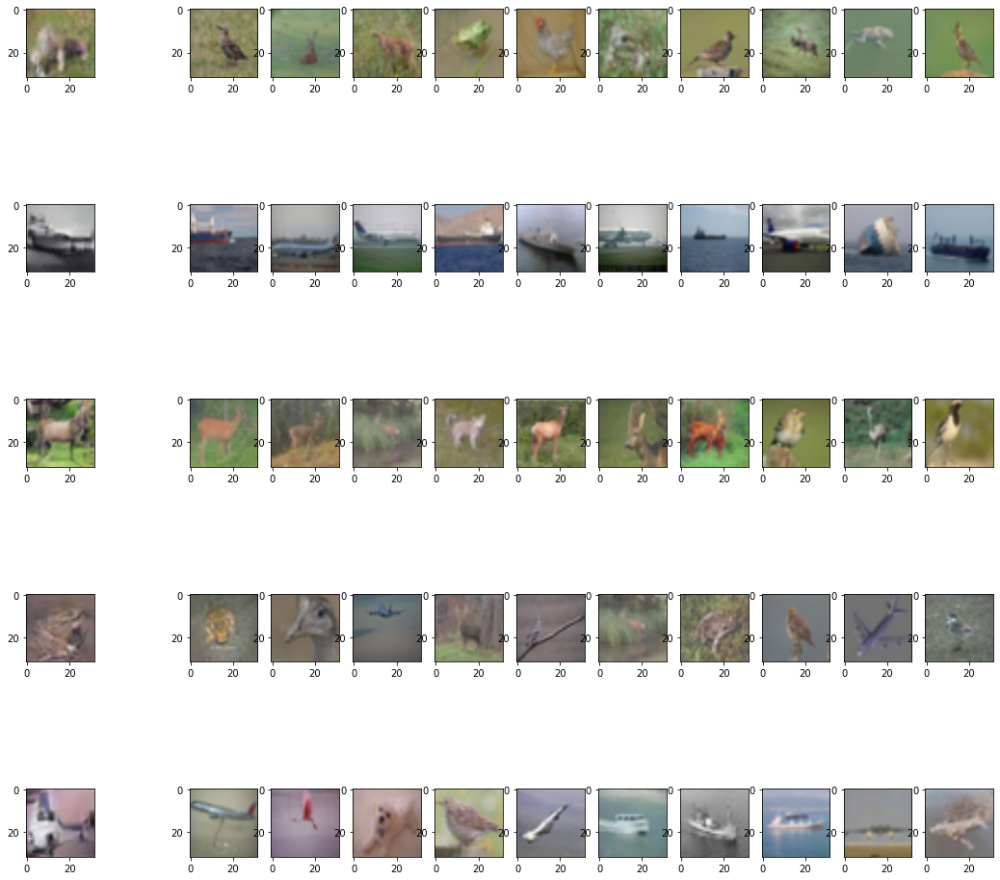

In [182]:
R, C = 5, 12
plt.figure(figsize=(18, 18))
for i in range(5):
    plt.subplot(R, C, i*12 + 1)
    show_image(generated_dataset_sngan[i])
    for j in range(2, 12):
      plt.subplot(R, C, i*12 + j + 1)
      show_image(nearest_images_list_sngan_CIFAR10[i][j - 2])
plt.show()

## Conclusion: are they different enough from the dataset?

yes they are different enough the values are comparable to those of question 2, which is more than enough for differences.

The generated images do not look like the dataset as I visualized